<a href="https://colab.research.google.com/github/VishwanathKundral/INSE-6220-Final-Report/blob/main/code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

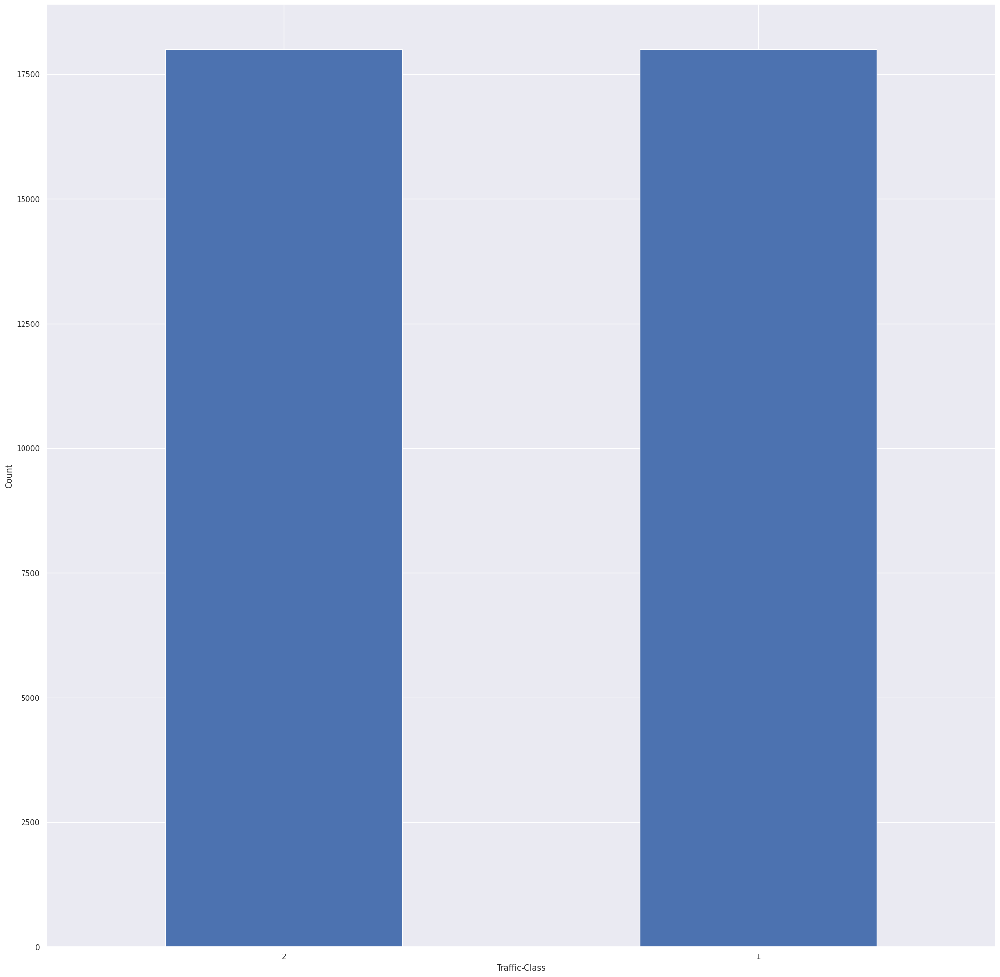

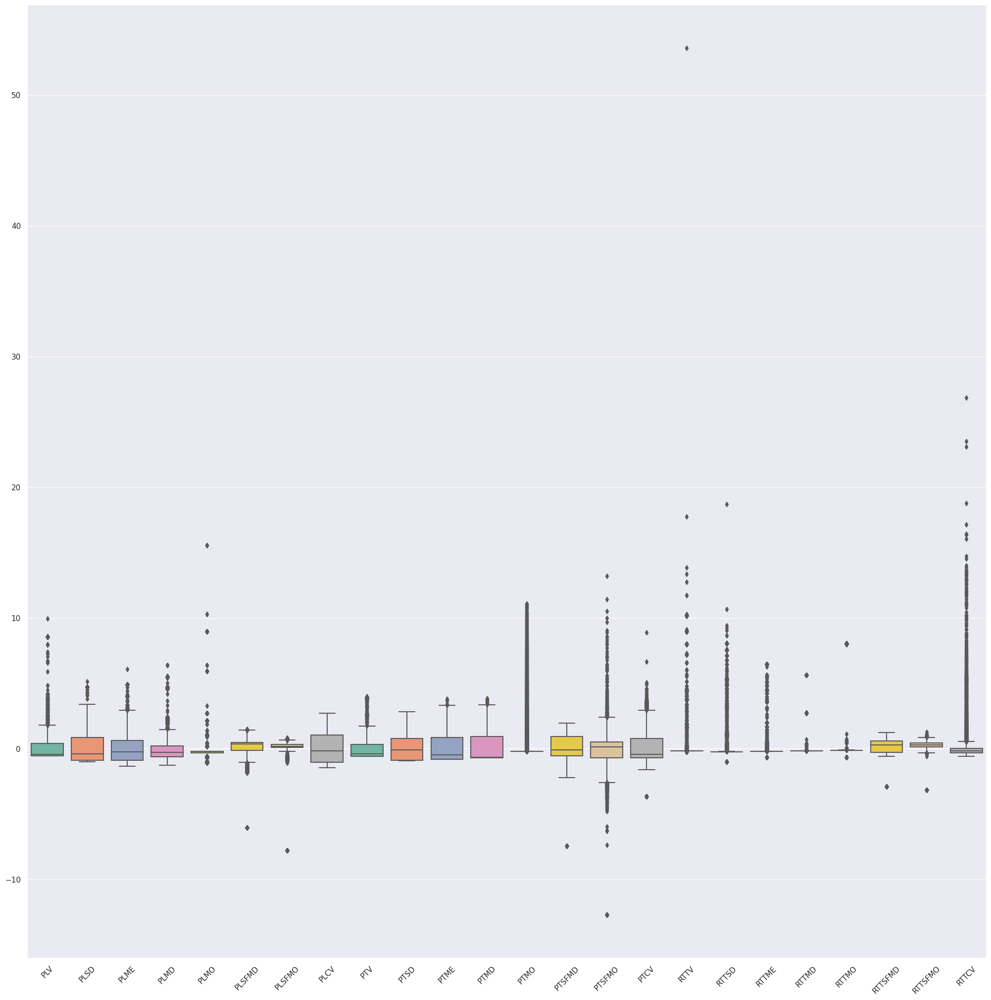

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = (25,25)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

dns_security_traffic_data = pd.read_csv("DNSSecurityTrafficData.csv", encoding="utf-8")

deciding_factor_for_prediction = dns_security_traffic_data['Traffic-Class']
convert_data_to_numpy = dns_security_traffic_data['Traffic-Class'].to_numpy()
pairplot_data=dns_security_traffic_data
actual_data_for_model_and_train = dns_security_traffic_data.iloc[:, 0:24]

actual_data_for_model_and_train.describe().transpose()

transformed_data_std_scaler = StandardScaler().fit_transform(actual_data_for_model_and_train)
dns_security_traffic_data = pd.DataFrame(transformed_data_std_scaler)
dns_security_traffic_data.columns = actual_data_for_model_and_train.columns

dns_security_traffic_data.describe().transpose()

index_of_data = list(dns_security_traffic_data.index)
columns_of_data = list(dns_security_traffic_data.columns)


deciding_factor_for_prediction.value_counts().plot(kind='bar', rot=0)
plt.xlabel('Traffic-Class')
plt.ylabel('Count')
plt.show()

ax = plt.figure()
ax = sns.boxplot(data=dns_security_traffic_data, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:.25'` for same effect.
  warnings.warn(msg, FutureWarning)


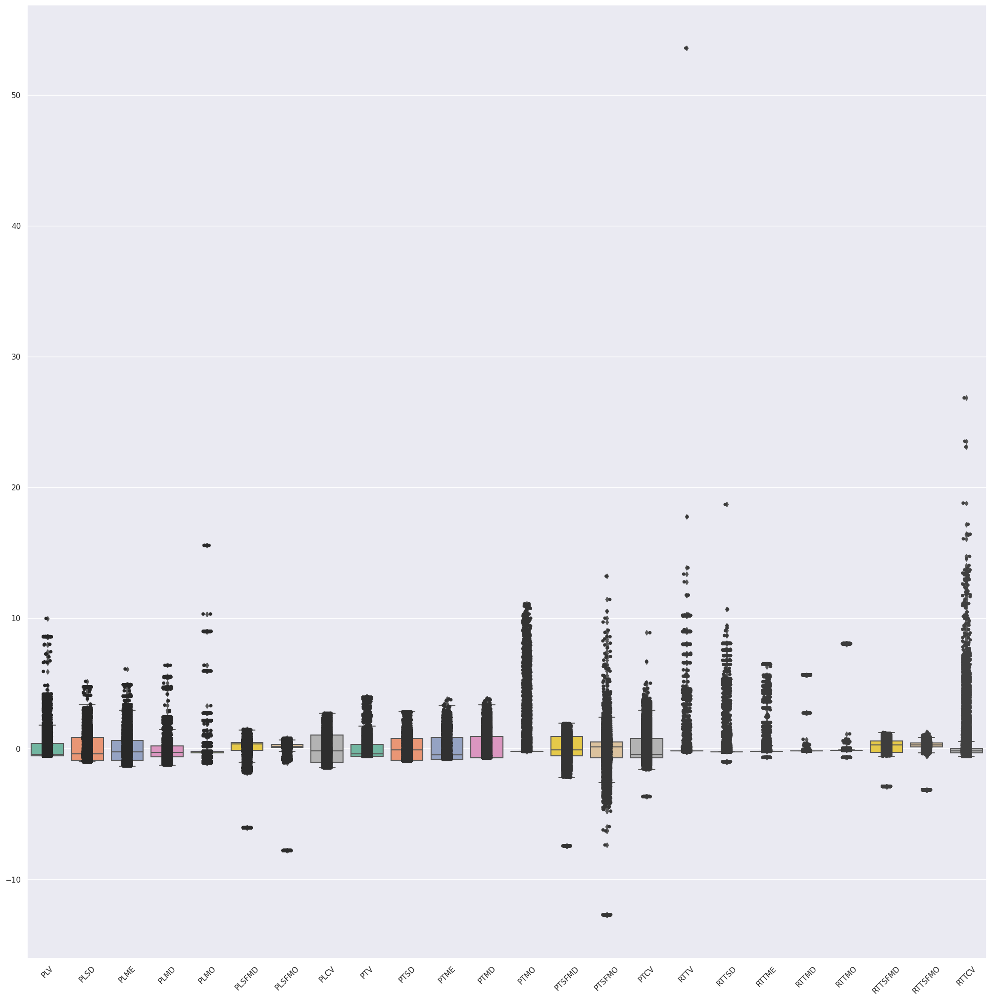

In [ ]:
#Code for all dots boxplot
ax = plt.figure()
ax = sns.boxplot(data=dns_security_traffic_data, orient="v", palette="Set2")
ax = sns.stripplot(data=dns_security_traffic_data, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show()

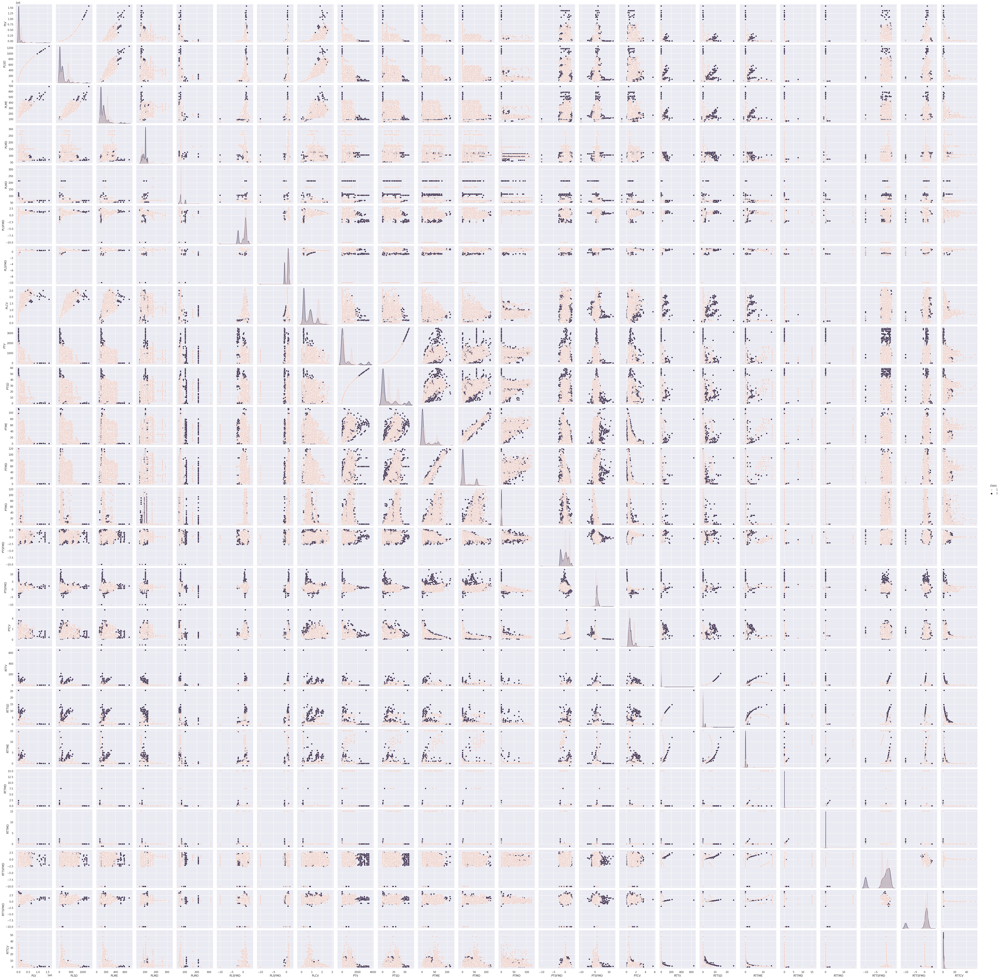

In [ ]:
#Code fore pairplot
dns_security_traffic_data.describe()
sns.pairplot(pairplot_data, hue='Traffic-Class')
plt.show()

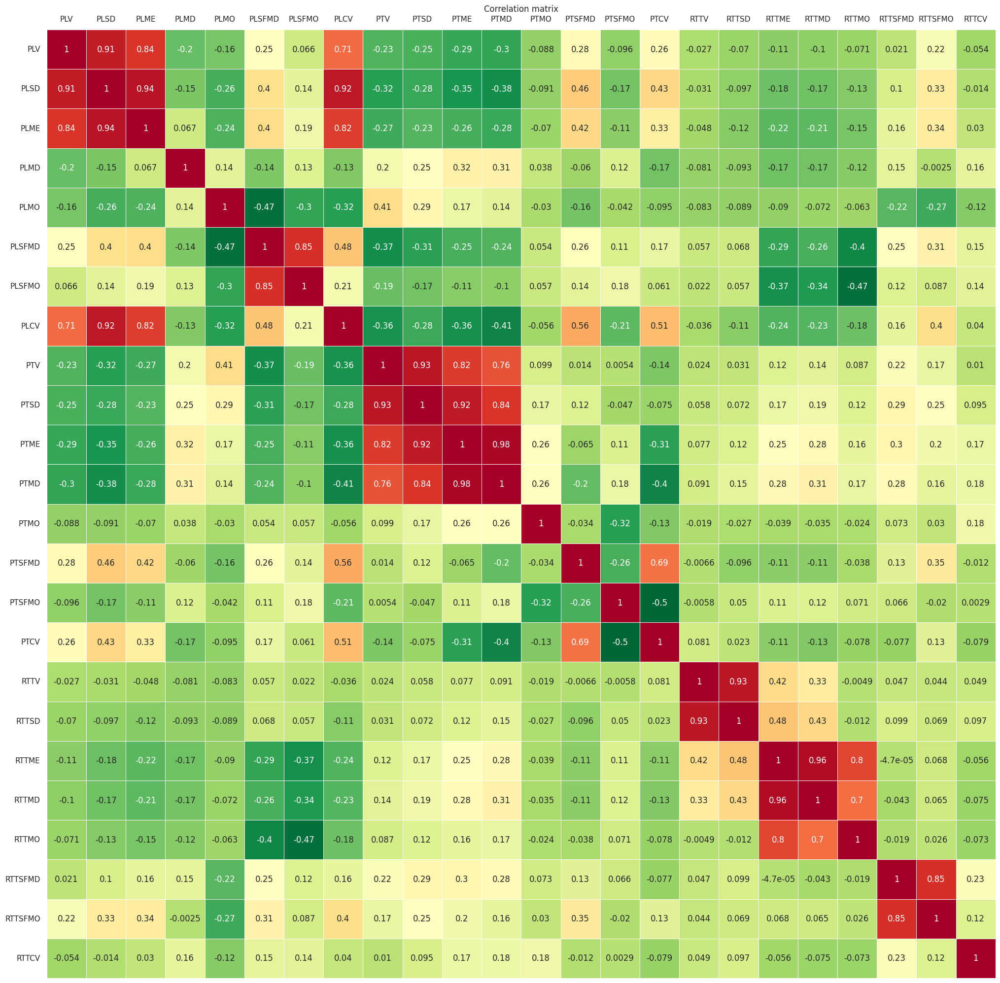

In [ ]:
#Correlation Matrix
dfc = dns_security_traffic_data - dns_security_traffic_data.mean() #centered data
ax = sns.heatmap(dfc.cov(), cmap='RdYlGn_r', linewidths=0.5, annot=True,
            cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);
plt.title('Correlation matrix')
plt.show()

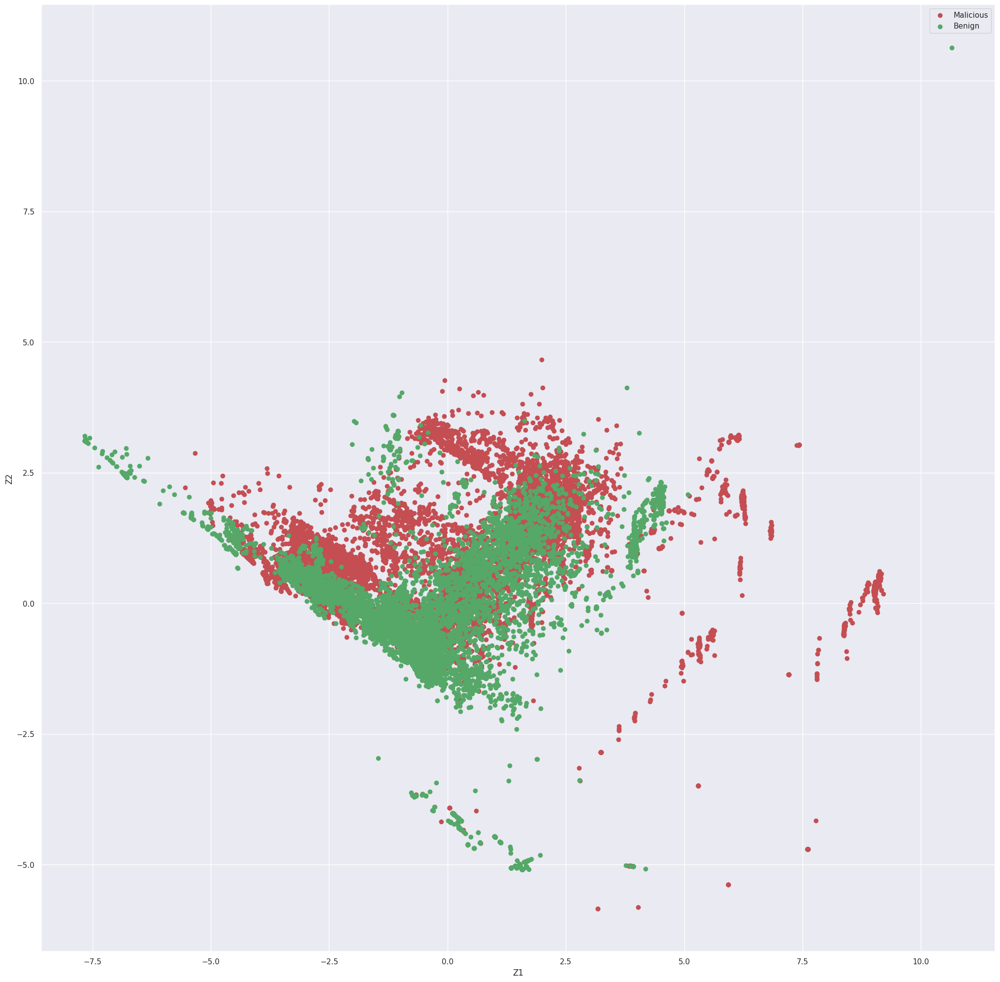

In [ ]:
#Scatter Plot
pca = PCA()
pca.fit(dns_security_traffic_data)
Z = pca.fit_transform(dns_security_traffic_data)

# 1(Malicious),  2(Benign)
idx_Malicious = np.where(deciding_factor_for_prediction == 1)
idx_Benign = np.where(deciding_factor_for_prediction == 2)

plt. figure()
plt.scatter(Z[idx_Malicious,0], Z[idx_Malicious,1], c='r', label='Malicious')
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Benign')
plt.legend()
plt.xlabel('Z1')
plt.ylabel('Z2')
plt.show()

Eigenvector matrix:
[[-0.27  0.15  0.13 -0.16 -0.15  0.3   0.27 -0.03 -0.17  0.09 -0.03 -0.1
   0.28 -0.12 -0.41  0.05 -0.38  0.21  0.25 -0.21 -0.01 -0.01 -0.01  0.26]
 [-0.33  0.2   0.11 -0.15 -0.1   0.2   0.18 -0.03 -0.05  0.03 -0.02 -0.02
  -0.02  0.05  0.08 -0.07 -0.06 -0.1  -0.04  0.09 -0.01  0.01  0.02 -0.83]
 [-0.3   0.22  0.04 -0.12 -0.14  0.25  0.21 -0.02  0.08 -0.11  0.   -0.03
   0.04 -0.07 -0.01  0.24  0.63 -0.16 -0.29  0.2   0.1   0.02 -0.01  0.3 ]
 [ 0.08  0.09 -0.25  0.02 -0.07  0.21  0.09  0.06  0.65 -0.58  0.08 -0.07
  -0.02 -0.   -0.07 -0.14 -0.06  0.05  0.12 -0.19 -0.04 -0.02 -0.01 -0.05]
 [ 0.15 -0.11 -0.14 -0.28  0.17  0.34  0.    0.15 -0.09  0.13  0.78 -0.07
  -0.1   0.06  0.12  0.18 -0.04  0.04  0.    0.02 -0.02 -0.01 -0.   -0.  ]
 [-0.25  0.14 -0.09  0.38  0.   -0.09 -0.08 -0.29 -0.13  0.05  0.2  -0.2
  -0.08  0.02  0.18  0.16  0.29  0.01  0.3  -0.56 -0.08 -0.06 -0.01 -0.06]
 [-0.16  0.08 -0.21  0.4   0.07  0.01 -0.09 -0.42  0.01 -0.05  0.24 -0.3
   0.21 -0.11 -

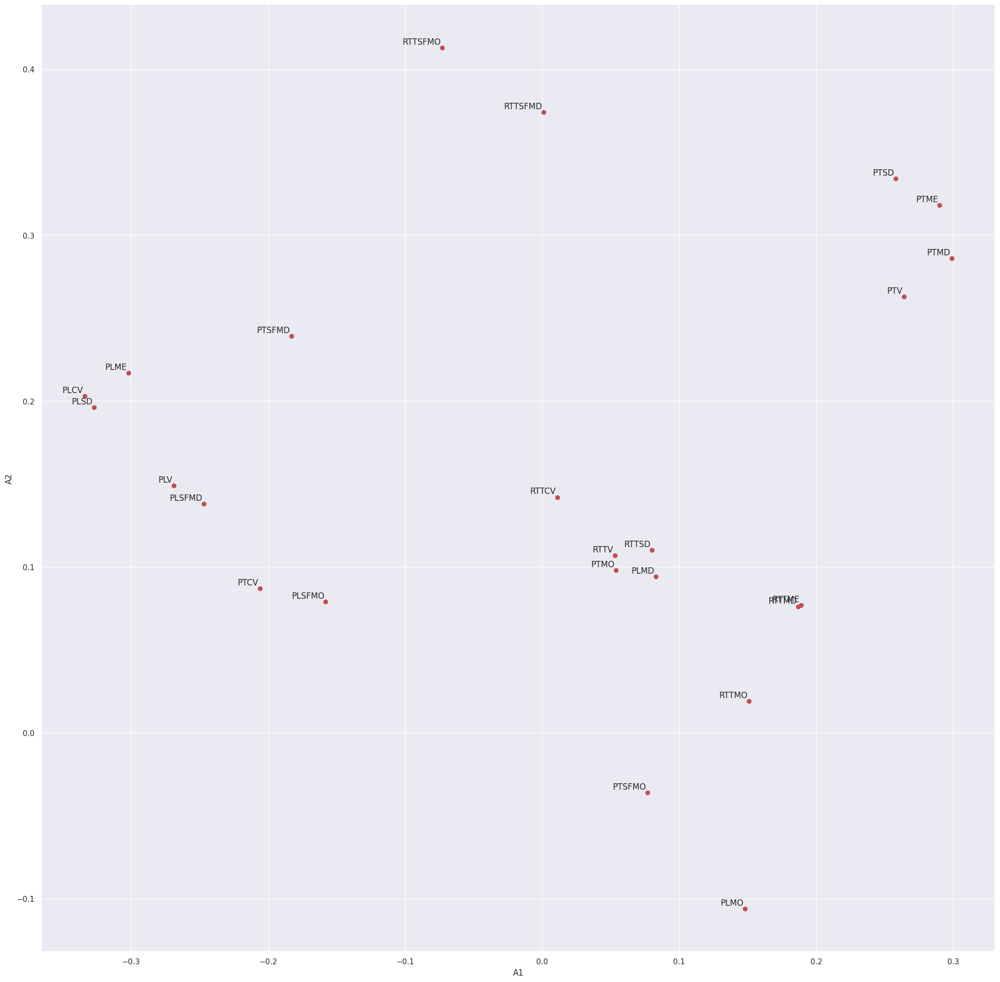

In [ ]:
#Eigen Vector Matrix
A = pca.components_.T
np.set_printoptions(precision=2)
A=np.matrix(A).round(decimals=3)
print(f'Eigenvector matrix:\n{A}')

plt.figure()
plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, deciding_factor_for_prediction in zip(columns_of_data, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, deciding_factor_for_prediction), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
plt.show()

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


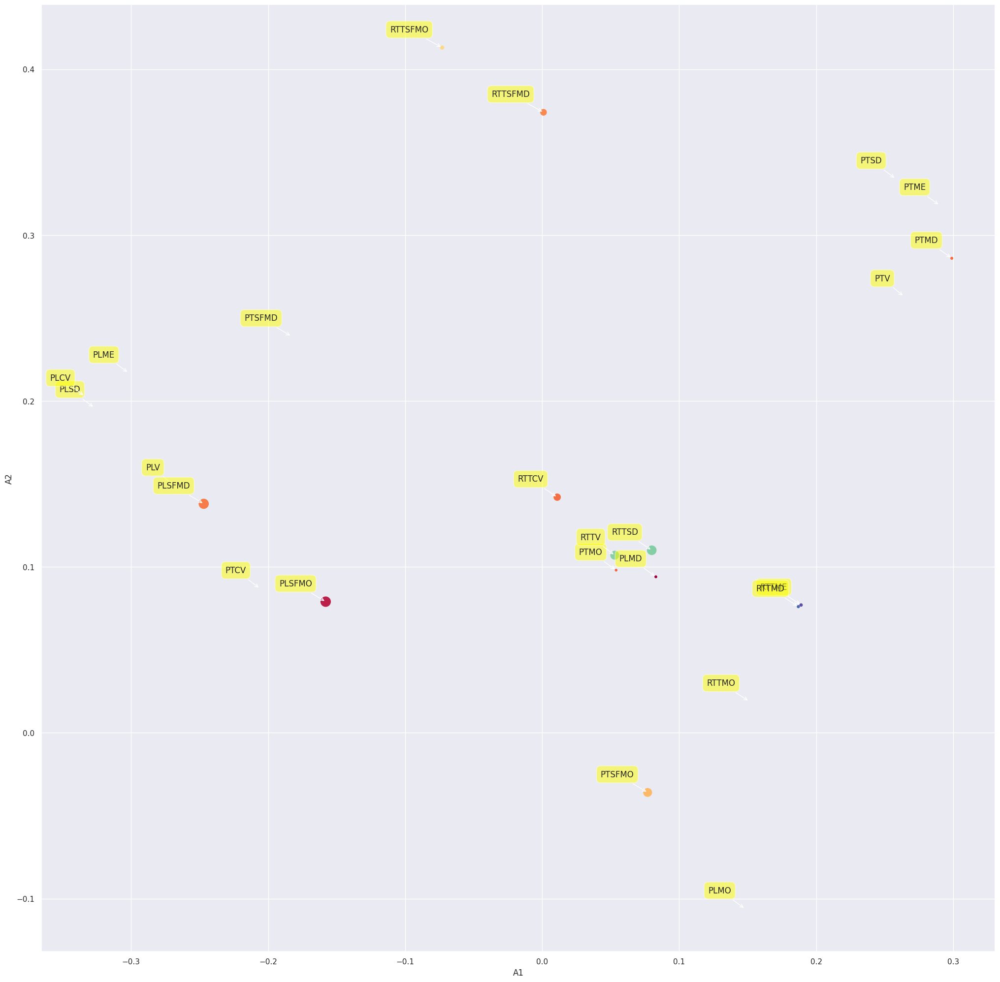

In [ ]:
#Eigen Vector with wighted plot
plt.figure()
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('A1')
plt.ylabel('A2')
for label, x, deciding_factor_for_prediction in zip(columns_of_data, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, deciding_factor_for_prediction), xytext=(-20, 20),
               textcoords='offset points', ha='right', va='bottom',
               bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
               arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
plt.show()

Eigenvalues:
[6.1489 3.4797 3.0586 2.3573 1.7118 1.3658 1.2108 1.012  0.9321 0.7332
 0.5353 0.4166 0.2374 0.1925 0.1864 0.1329 0.0938 0.0778 0.0465 0.0288
 0.0262 0.0085 0.0052 0.0025]


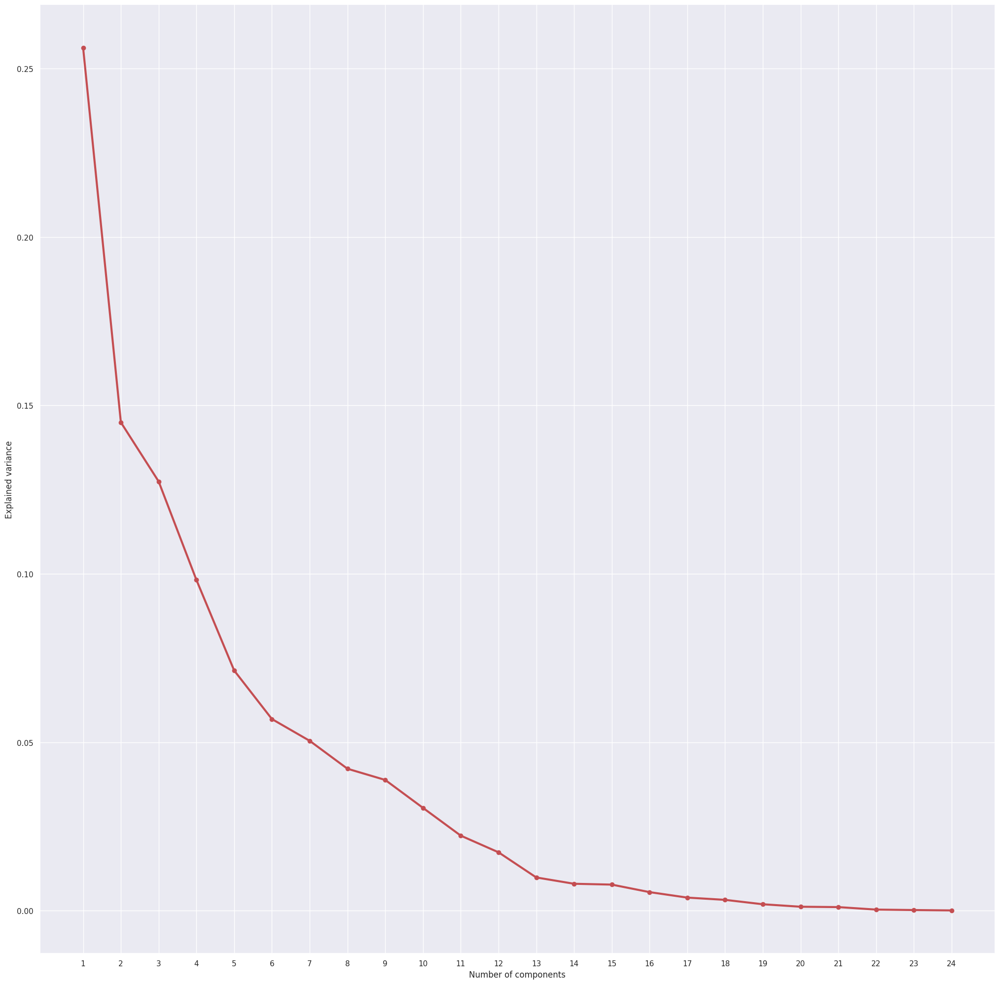

In [ ]:
#Eigenvalues/Scree plot
np.set_printoptions(precision=4, suppress=True)
Lambda = pca.explained_variance_
#Lambda = np.matrix(Lambda).round(decimals=3)
print(f'Eigenvalues:\n{Lambda}')

plt. figure()
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

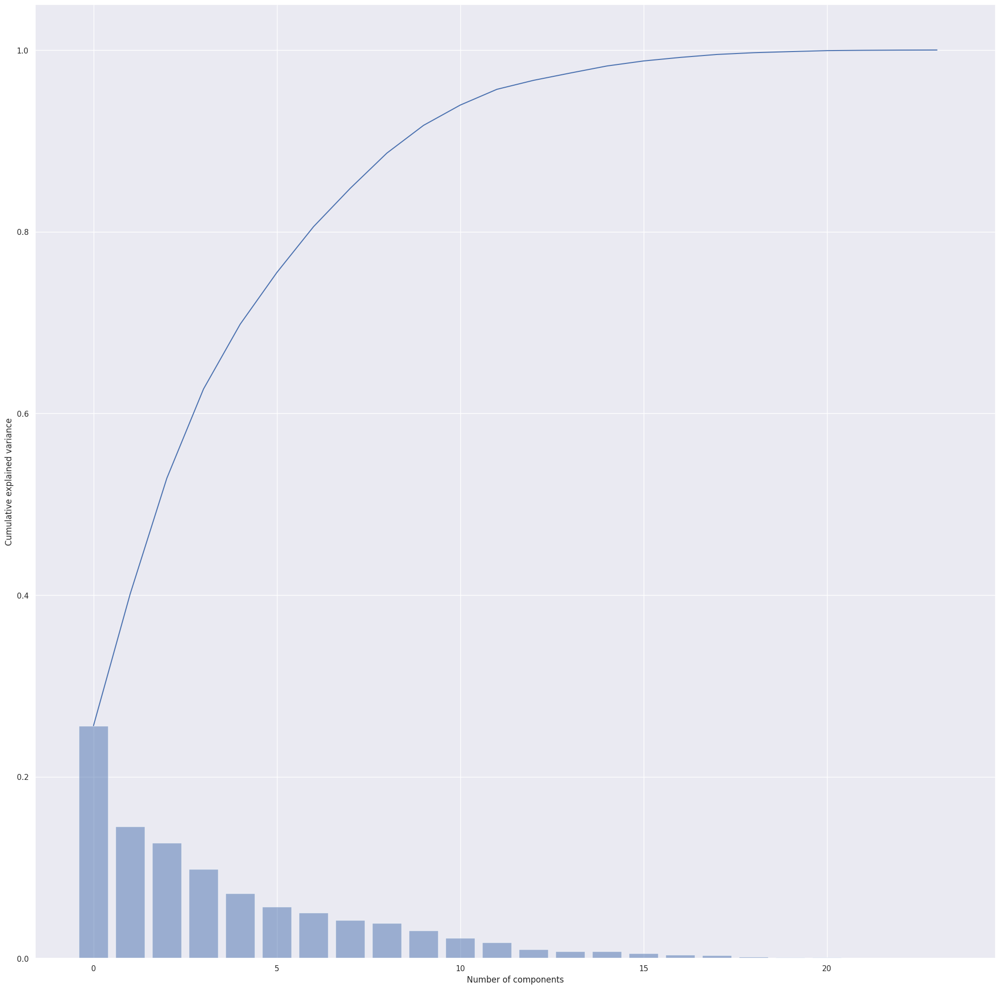

In [ ]:
#Pareto Plot
ell = pca.explained_variance_ratio_
plt.figure()
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.show()

{'0': 'PC 1 (25.6%)', '1': 'PC 2 (14.5%)', '2': 'PC 3 (12.7%)', '3': 'PC 4 (9.8%)', '4': 'PC 5 (7.1%)', '5': 'PC 6 (5.7%)', '6': 'PC 7 (5.0%)', '7': 'PC 8 (4.2%)', '8': 'PC 9 (3.9%)', '9': 'PC 10 (3.1%)', '10': 'PC 11 (2.2%)', '11': 'PC 12 (1.7%)', '12': 'PC 13 (1.0%)', '13': 'PC 14 (0.8%)', '14': 'PC 15 (0.8%)', '15': 'PC 16 (0.6%)', '16': 'PC 17 (0.4%)', '17': 'PC 18 (0.3%)', '18': 'PC 19 (0.2%)', '19': 'PC 20 (0.1%)', '20': 'PC 21 (0.1%)', '21': 'PC 22 (0.0%)', '22': 'PC 23 (0.0%)', '23': 'PC 24 (0.0%)'}


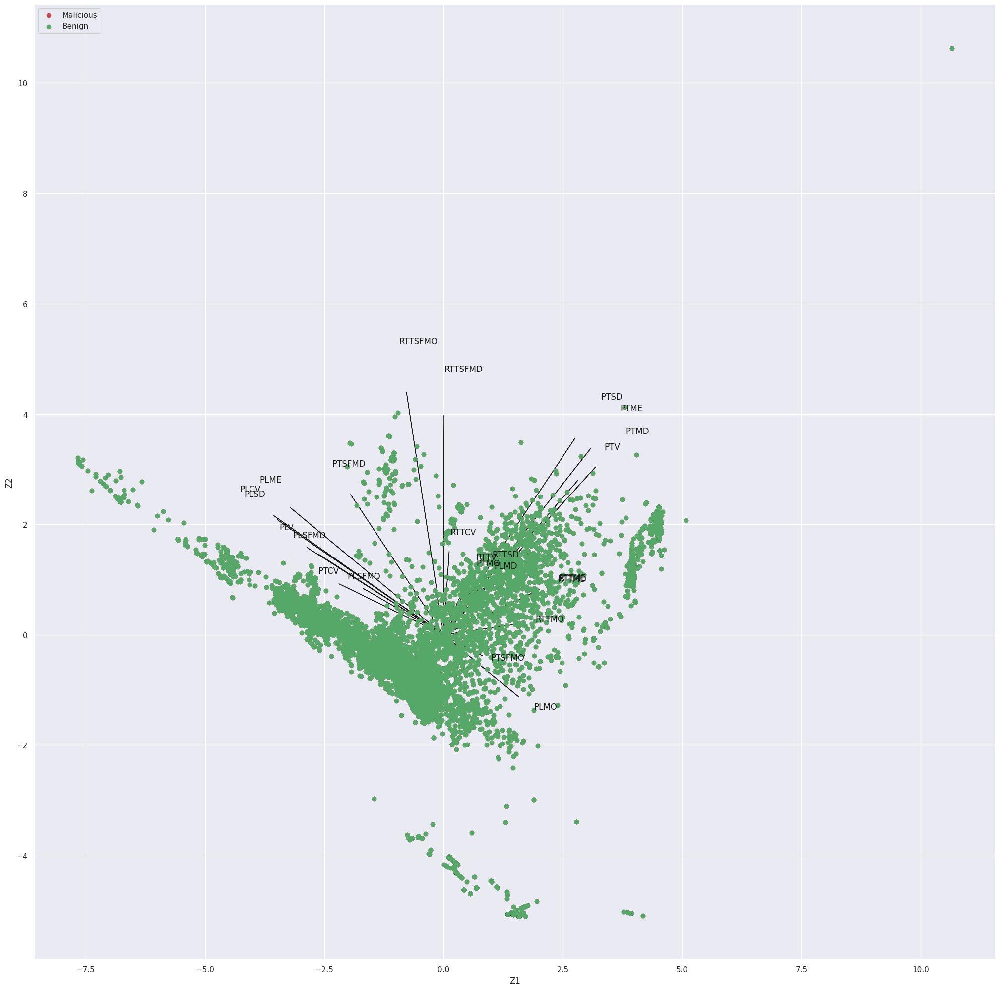

In [ ]:
PC_variance = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}
print(PC_variance)

A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt.figure()
plt.xlabel('Z1')
plt.ylabel('Z2')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2, columns_of_data[i], color='k')

plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='r', label='Malicious')
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Benign')
plt.legend(loc='upper left')
plt.show()

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [24] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [12] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [24] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[12]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.


[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


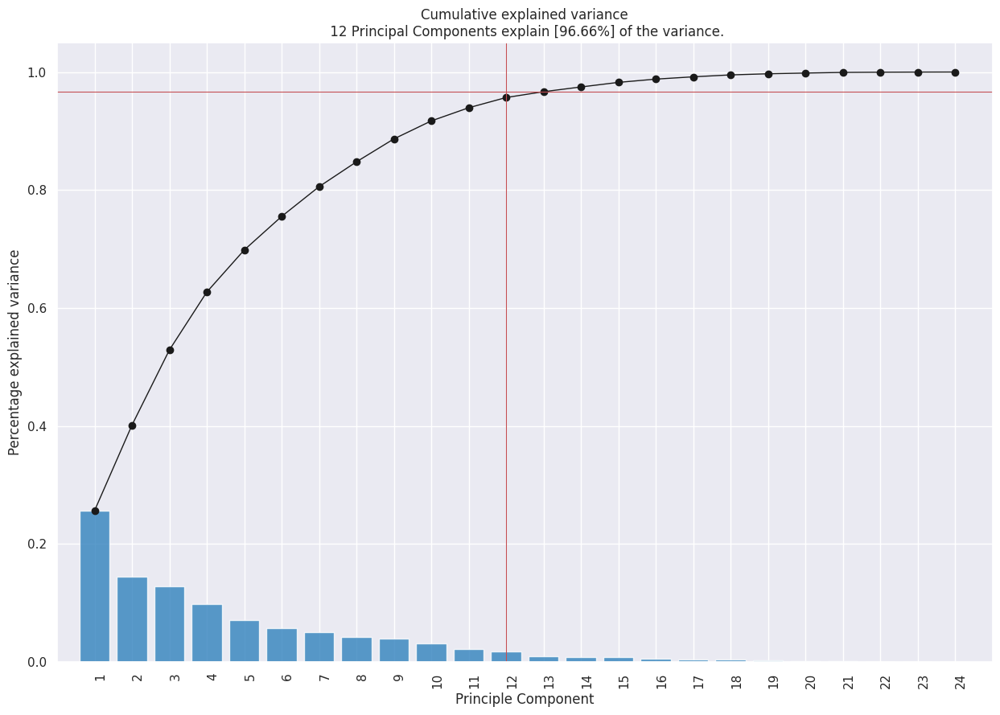

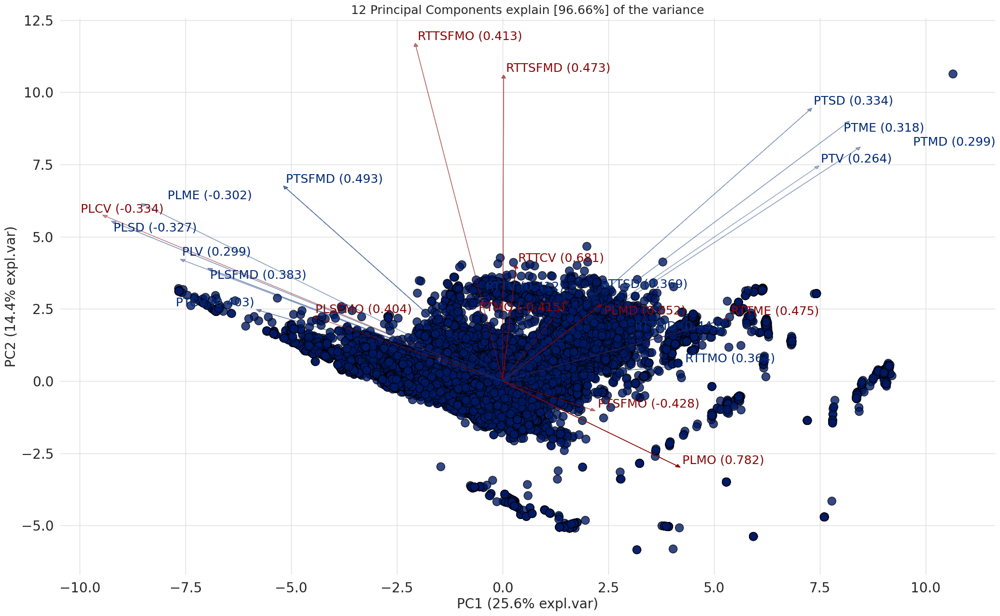

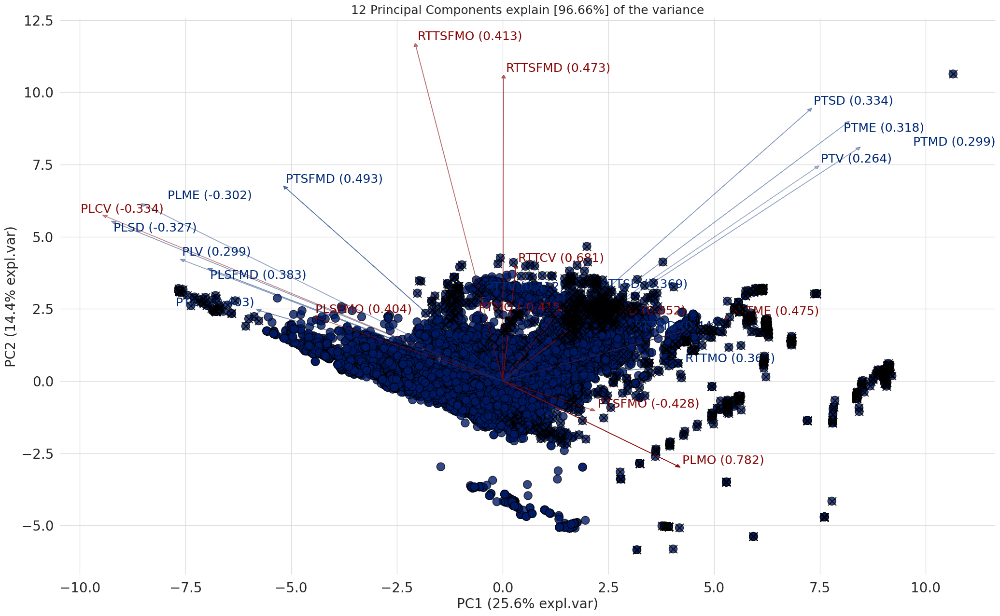

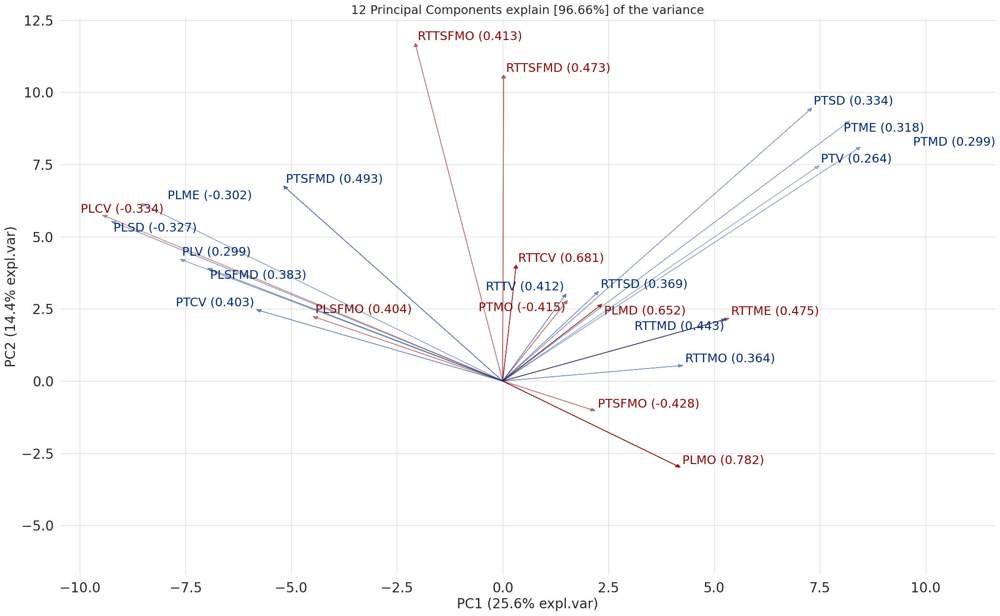

In [ ]:
#Biplot
dns_security_traffic_data = pd.read_csv("DNSSecurityTrafficData.csv", encoding="utf-8")
deciding_factor_for_prediction = dns_security_traffic_data['Traffic-Class']
convert_data_to_numpy = dns_security_traffic_data['Traffic-Class'].to_numpy()
actual_data_for_model_and_train = dns_security_traffic_data.iloc[:, 0:24]

transformed_data_std_scaler = StandardScaler().fit_transform(actual_data_for_model_and_train)
dns_security_traffic_data = pd.DataFrame(transformed_data_std_scaler)
dns_security_traffic_data.columns = actual_data_for_model_and_train.columns
dns_security_traffic_data.describe().transpose()
index_of_data = list(dns_security_traffic_data.index)
columns_of_data = list(dns_security_traffic_data.columns)

pca = PCA()
pca.fit(dns_security_traffic_data)
Z = pca.fit_transform(dns_security_traffic_data)

A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

#Run Independently at the end
!pip install pca
from pca import pca
model = pca()
# Fit transform
out = model.fit_transform(dns_security_traffic_data)
model.plot()
ax = model.biplot(label=False, legend=False)
model.biplot(legend=False, HT2=True)
model.biplot(cmap=None, label=False, legend=False)
#ax = model.biplot3d(legend=False)
plt.show()